<a href="https://colab.research.google.com/github/shaswata09/Offroad-Path-Planning/blob/main/Road_Extractor_Ensemble_Massachuests.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -U albumentations

!pip install --upgrade opencv-python

!pip install segmentation-models-pytorch==0.2.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 123 kB 2.1 MB/s 
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.2.1
    Uninstalling albumentations-1.2.1:
      Successfully uninstalled albumentations-1.2.1
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 2.1 MB/s 
     |████████████████████████████████| 376 kB 10.5 MB/s 
     |████████████████████████████████| 58 kB 6.0 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12421 sha256=51fd93baef24d3b2f69ee64c5daaff467472fb5b69301dbffddc6f71a5ceb543
  Stored in directory: /root/.cache/pip/wheels/90/6b/0c/f0ad36d00310e65390b0d4c9218ae6250ac579c92540c9097a
  Creat

In [ ]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album

import segmentation_models_pytorch as smp

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/

Mounted at /content/drive
/content/drive/MyDrive


In [ ]:
DATA_DIR = './massachusetts-roads-dataset/tiff/'

x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'train_labels')
print(x_train_dir)
print(y_train_dir)

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'val_labels')
print(x_valid_dir)
print(y_valid_dir)

# x_test_dir = os.path.join(DATA_DIR, 'custom_offroad_testset')
# x_test_dir = os.path.join(DATA_DIR, 'cavs_offroad_dataset')
x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'test_labels')
print(x_test_dir)
print(y_test_dir)

./massachusetts-roads-dataset/tiff/train
./massachusetts-roads-dataset/tiff/train_labels
./massachusetts-roads-dataset/tiff/val
./massachusetts-roads-dataset/tiff/val_labels
./massachusetts-roads-dataset/tiff/test
./massachusetts-roads-dataset/tiff/test_labels


In [ ]:
class_dict = pd.read_csv("./massachusetts-roads-dataset/label_class_dict.csv")
# Get class names
class_names = class_dict['name'].tolist()
# Get class RGB values
class_rgb_values = class_dict[['r','g','b']].values.tolist()

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['background', 'road']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]


In [ ]:
select_classes = ['background', 'road']

# Get RGB values of required classes
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', select_classes)
print('Class RGB values: ', select_class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['background', 'road']
Class RGB values:  [[  0   0   0]
 [255 255 255]]


In [ ]:
from numpy.ma.core import shape
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        # print(shape(label))
        # print(colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)
    # print(shape(semantic_map))
    return semantic_map
    
# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image 
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified 
        class key.
    """
    x = np.argmax(image, axis = -1)
    # print(shape(x))
    return x

# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, label_values):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Colour coded image for segmentation visualization
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]
    # print(image.astype(int))
    # print(shape(x))

    return x

In [ ]:
class RoadsDataset(torch.utils.data.Dataset):

    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        
        self.image_paths = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
        self.mask_paths = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]

        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read images and masks
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)
        
        # print(self.image_paths[i] , '---', self.mask_paths[i])
        # print(i)

        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return length of 
        return len(self.image_paths)

In [ ]:
def get_training_augmentation():
    train_transform = [    
        album.Resize(height=1536, width=1536, interpolation=cv2.INTER_NEAREST),
        album.RandomCrop(height=256, width=256, always_apply=True),
        album.OneOf(
            [
                album.HorizontalFlip(p=1),
                album.VerticalFlip(p=1),
                album.RandomRotate90(p=1),
            ],
            p=0.75,
        ),
    ]
    return album.Compose(train_transform)



def get_validation_augmentation():   
    # Add sufficient padding to ensure image is divisible by 32
    test_transform = [
        album.PadIfNeeded(min_height=1536, min_width=1536, always_apply=True, border_mode=0),
    ]
    return album.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """   
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)

In [ ]:
augmented_dataset = RoadsDataset(
    x_train_dir, y_train_dir, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

dataset = RoadsDataset(x_train_dir, y_train_dir, class_rgb_values=select_class_rgb_values)

# Different augmentations on a random image/mask pair (256*256 crop)
for i in range(5):

    random_idx = random.randint(0, len(augmented_dataset)-1)
    image, mask = augmented_dataset[random_idx]
    # print(image.shape, mask.shape )
    visualize(
        original_image = image,
        ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
        one_hot_encoded_mask = reverse_one_hot(mask)
    )


In [ ]:
augmented_dataset = RoadsDataset(
    x_train_dir, y_train_dir, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

dataset = RoadsDataset(x_train_dir, y_train_dir, class_rgb_values=select_class_rgb_values)

# Different augmentations on a random image/mask pair (256*256 crop)
for i in range(5):

    random_idx = random.randint(0, len(augmented_dataset)-1)
    image, mask = augmented_dataset[random_idx]
    # print(image.shape, mask.shape )
    visualize(
        original_image = image,
        ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
        one_hot_encoded_mask = reverse_one_hot(mask)
    )


In [ ]:
# https://github.com/qubvel/segmentation_models.pytorch#encoders
# Test with the other models in the above link
####################################
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = select_classes
ACTIVATION = 'softmax' # could be None for logits or 'softmax2d' for multiclass segmentation

# create segmentation model with pretrained encoder
model_deepLab = smp.DeepLabV3Plus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

model_unet = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [ ]:
# Set device: `cuda` or `cpu`
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# load best saved Unet model checkpoint from the current run
if os.path.exists('./best_model_unet_softmax_deepglobe.pth'):
    best_model_unet = torch.load('./best_model_unet_softmax_deepglobe.pth', map_location=DEVICE)
    print('Loaded UNet model from this run.')

else:
  print('Error!!! Unable to load model from drive.')

Loaded UNet model from this run.


In [ ]:
# load best saved DeepLab model checkpoint from the current run
if os.path.exists('./best_model_DeepLab_softmax_deepglobe.pth'):
    best_model_deepLab = torch.load('./best_model_DeepLab_softmax_deepglobe.pth', map_location=DEVICE)
    print('Loaded DeepLabV3+ model from this run.')

else:
  print('Error!!! Unable to load model from drive.')

Loaded DeepLabV3+ model from this run.


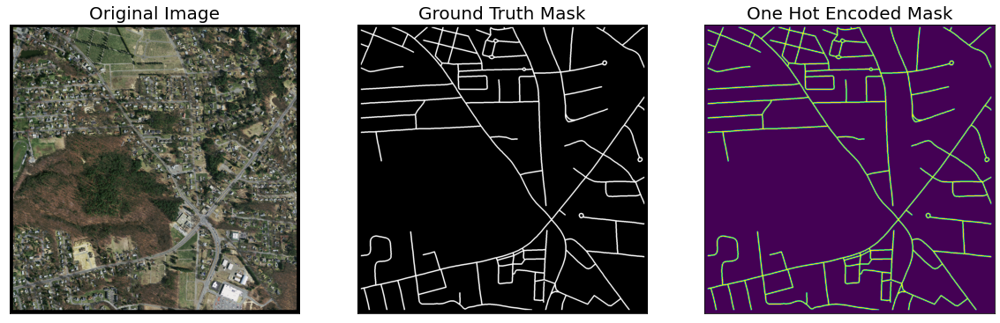

In [ ]:
# create test dataloader to be used with UNet model (with preprocessing operation: to_tensor(...))
test_dataset = RoadsDataset(
    x_test_dir, 
    y_test_dir, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataloader = DataLoader(test_dataset)

# test dataset for visualization (without preprocessing transformations)
test_dataset_vis = RoadsDataset(
    x_test_dir, y_test_dir, 
    augmentation=get_validation_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

# get a random test image/mask index
random_idx = random.randint(0, len(test_dataset_vis)-1)
image, mask = test_dataset_vis[random_idx]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

# Notice the images / masks are 1536*1536 because of 18px padding on all sides. 
# This is to ensure the input image dimensions to UNet model are a multiple of 2 (to account for pooling & transpose conv. operations).

In [ ]:
# Center crop padded image / mask to original image dims
def crop_image(image, target_image_dims=[1500,1500,3]):
   
    target_size = target_image_dims[0]
    image_size = len(image)
    padding = (image_size - target_size) // 2

    if padding<0:
        return image

    return image[
        padding:image_size - padding,
        padding:image_size - padding,
        :,
    ]


def preprocess_resize_image(image):
  # image = torch.from_numpy(image)
  # image = image.permute(1,2,0)
  # image = image.cpu().detach().numpy()
  # image = cv2.resize(image, (1536, 1536), interpolation = cv2.INTER_AREA)
  # image = torch.from_numpy(image)
  # image = image.permute(2,0, 1)
  # image = image.cpu().detach().numpy()
  image = np.transpose(image, (1,2,0))
  image = cv2.resize(image, (1536, 1536), interpolation = cv2.INTER_AREA)
  image = np.transpose(image, (2,0,1))
  return image

In [ ]:
sample_preds_folder = 'sample_predictions/'
original_image_folder = 'original_image/'
ground_truth_folder = 'ground_truth/'
predictions_folder = 'predictions/'
prediction_matrix = 'prediction_matrix/'
# road_heatmap_folder = 'road_heatmap/'
if not os.path.exists(sample_preds_folder):
    os.makedirs(sample_preds_folder + original_image_folder)
    os.makedirs(sample_preds_folder + ground_truth_folder)
    os.makedirs(sample_preds_folder + predictions_folder)
    os.makedirs(sample_preds_folder + prediction_matrix)
    # os.makedirs(sample_preds_folder + road_heatmap_folder)

In [ ]:
def get_ensemble_maxpool_prediction(pred_mask_unet, pred_mask_deepLab):

  # print(pred_mask_unet[0][0] if pred_mask_unet[0][0][1] > pred_mask_deepLab[0][0][1] else pred_mask_deepLab[0][0] )

  pred_mask_ensemble = pred_mask_unet.copy()

  if pred_mask_unet.shape == pred_mask_deepLab.shape:
    for i in range(pred_mask_unet.shape[0]):
      for j in range(pred_mask_unet.shape[1]):
       pred_mask_ensemble[i][j] = pred_mask_unet[i][j] if pred_mask_unet[i][j][1] > pred_mask_deepLab[i][j][1] else pred_mask_deepLab[i][j]
  else:
    print("Error!!! Prediction matrix error occured.")

  return pred_mask_ensemble

In [ ]:
def get_iou_score(pred_mask_ensemble, pred_mask_groundtruth):
  iou = smp.utils.metrics.IoU(threshold=0.5)
  return iou.forward(pred_mask_ensemble, pred_mask_groundtruth)

In [ ]:
def get_dice_loss(pred_mask_ensemble, pred_mask_groundtruth):
  d_loss = smp.utils.losses.DiceLoss()
  return d_loss.forward(pred_mask_ensemble, pred_mask_groundtruth)

Ensemble IoU:  tensor(0.3460)
Ensemble Dice Loss:  tensor(0.4859)
UNet IoU:  tensor(0.3481)
UNet Dice Loss:  tensor(0.4836)
DeepLab IoU:  tensor(0.3176)
DeepLab Dice Loss:  tensor(0.5179)


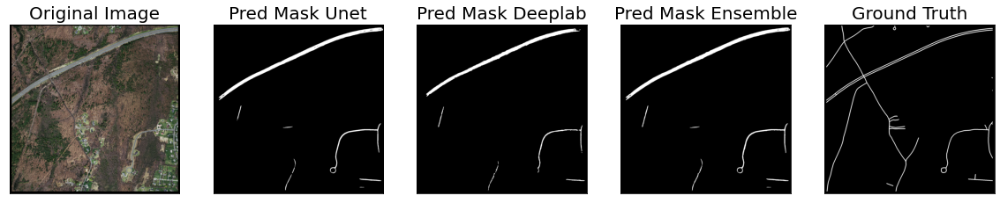

Ensemble IoU:  tensor(0.2136)
Ensemble Dice Loss:  tensor(0.6480)
UNet IoU:  tensor(0.2128)
UNet Dice Loss:  tensor(0.6490)
DeepLab IoU:  tensor(0.3123)
DeepLab Dice Loss:  tensor(0.5240)


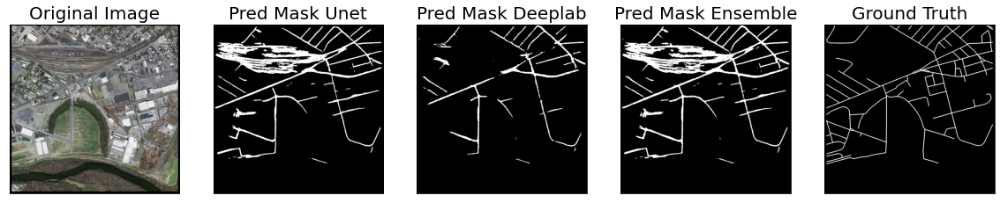

Ensemble IoU:  tensor(0.3809)
Ensemble Dice Loss:  tensor(0.4483)
UNet IoU:  tensor(0.3852)
UNet Dice Loss:  tensor(0.4438)
DeepLab IoU:  tensor(0.3094)
DeepLab Dice Loss:  tensor(0.5274)


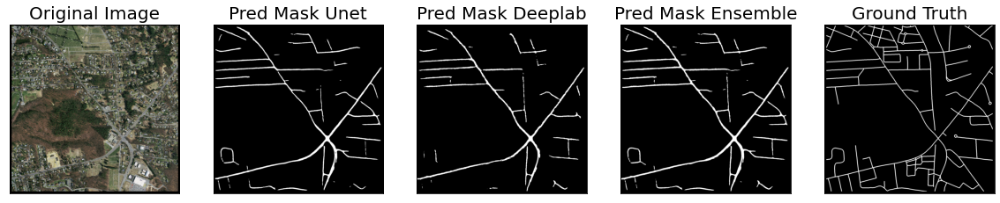

Ensemble IoU:  tensor(0.3963)
Ensemble Dice Loss:  tensor(0.4324)
UNet IoU:  tensor(0.3836)
UNet Dice Loss:  tensor(0.4455)
DeepLab IoU:  tensor(0.3434)
DeepLab Dice Loss:  tensor(0.4887)


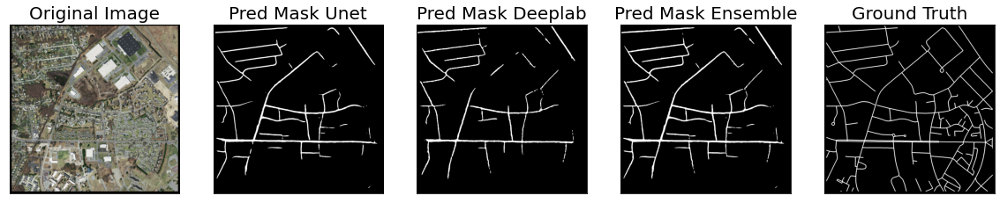

Ensemble IoU:  tensor(0.4316)
Ensemble Dice Loss:  tensor(0.3970)
UNet IoU:  tensor(0.4154)
UNet Dice Loss:  tensor(0.4130)
DeepLab IoU:  tensor(0.3551)
DeepLab Dice Loss:  tensor(0.4759)


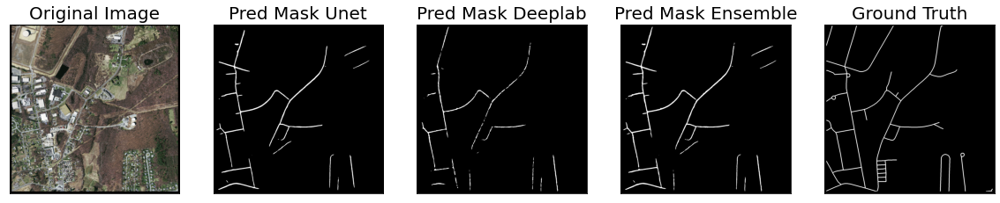

Ensemble IoU:  tensor(0.3858)
Ensemble Dice Loss:  tensor(0.4432)
UNet IoU:  tensor(0.3800)
UNet Dice Loss:  tensor(0.4493)
DeepLab IoU:  tensor(0.2615)
DeepLab Dice Loss:  tensor(0.5854)


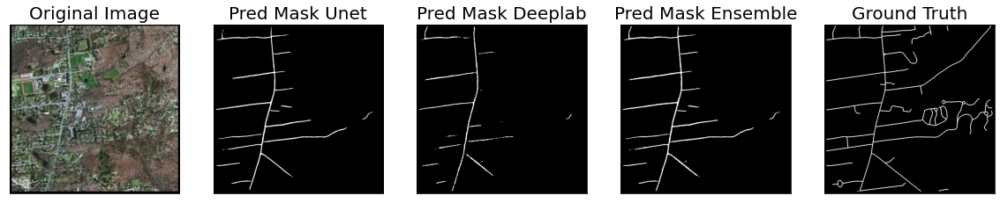

Ensemble IoU:  tensor(0.2160)
Ensemble Dice Loss:  tensor(0.6447)
UNet IoU:  tensor(0.1775)
UNet Dice Loss:  tensor(0.6985)
DeepLab IoU:  tensor(0.1435)
DeepLab Dice Loss:  tensor(0.7490)


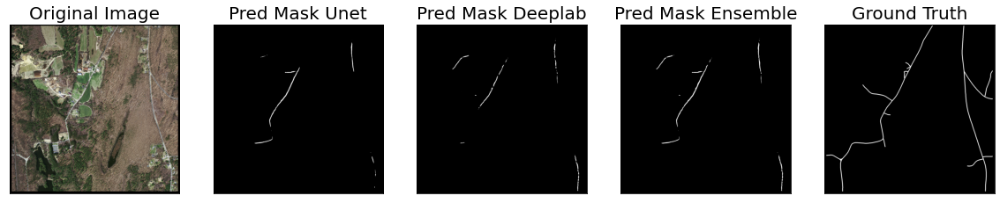

Ensemble IoU:  tensor(0.1635)
Ensemble Dice Loss:  tensor(0.7189)
UNet IoU:  tensor(0.1478)
UNet Dice Loss:  tensor(0.7424)
DeepLab IoU:  tensor(0.1037)
DeepLab Dice Loss:  tensor(0.8120)


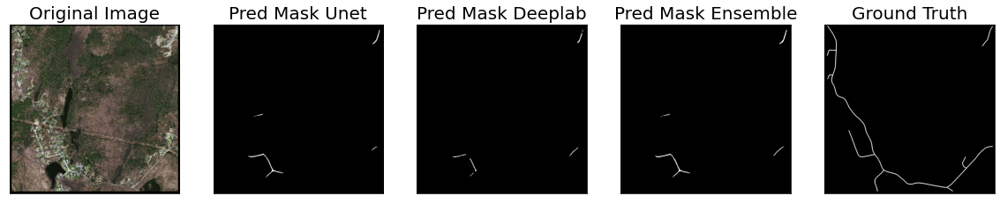

Ensemble IoU:  tensor(0.0143)
Ensemble Dice Loss:  tensor(0.9717)
UNet IoU:  tensor(0.0143)
UNet Dice Loss:  tensor(0.9717)
DeepLab IoU:  tensor(8.1301e-12)
DeepLab Dice Loss:  tensor(0.9999)


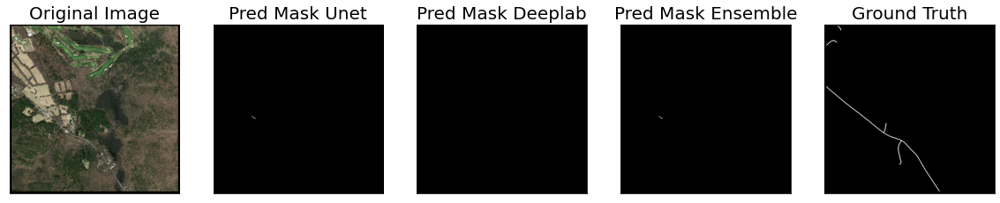

Ensemble IoU:  tensor(0.3824)
Ensemble Dice Loss:  tensor(0.4467)
UNet IoU:  tensor(0.3772)
UNet Dice Loss:  tensor(0.4522)
DeepLab IoU:  tensor(0.3461)
DeepLab Dice Loss:  tensor(0.4857)


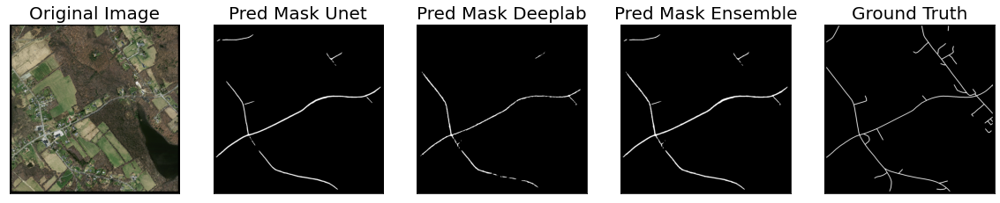

Ensemble IoU:  tensor(0.4230)
Ensemble Dice Loss:  tensor(0.4055)
UNet IoU:  tensor(0.4233)
UNet Dice Loss:  tensor(0.4052)
DeepLab IoU:  tensor(0.3441)
DeepLab Dice Loss:  tensor(0.4880)


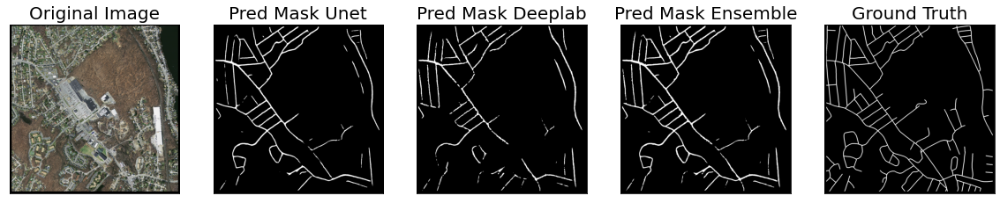

Ensemble IoU:  tensor(0.1720)
Ensemble Dice Loss:  tensor(0.7065)
UNet IoU:  tensor(0.1528)
UNet Dice Loss:  tensor(0.7348)
DeepLab IoU:  tensor(0.1056)
DeepLab Dice Loss:  tensor(0.8089)


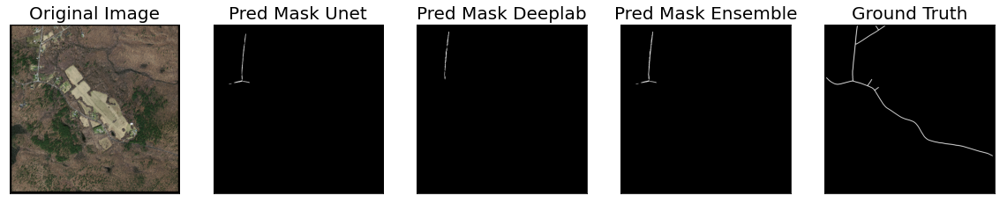

Ensemble IoU:  tensor(0.4168)
Ensemble Dice Loss:  tensor(0.4117)
UNet IoU:  tensor(0.3965)
UNet Dice Loss:  tensor(0.4321)
DeepLab IoU:  tensor(0.3616)
DeepLab Dice Loss:  tensor(0.4688)


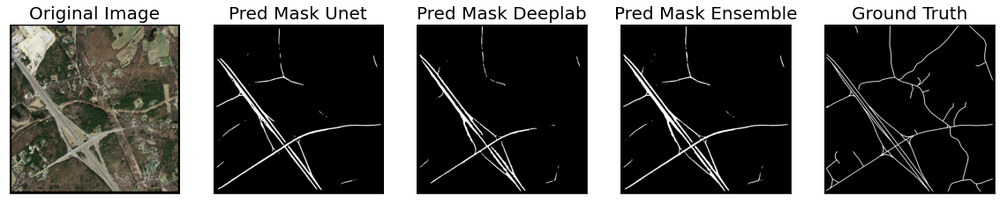

Ensemble IoU:  tensor(0.4186)
Ensemble Dice Loss:  tensor(0.4099)
UNet IoU:  tensor(0.4046)
UNet Dice Loss:  tensor(0.4239)
DeepLab IoU:  tensor(0.4023)
DeepLab Dice Loss:  tensor(0.4262)


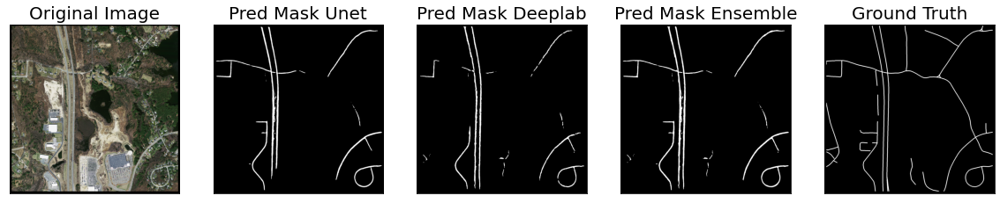

Ensemble IoU:  tensor(0.4710)
Ensemble Dice Loss:  tensor(0.3596)
UNet IoU:  tensor(0.4670)
UNet Dice Loss:  tensor(0.3633)
DeepLab IoU:  tensor(0.2627)
DeepLab Dice Loss:  tensor(0.5839)


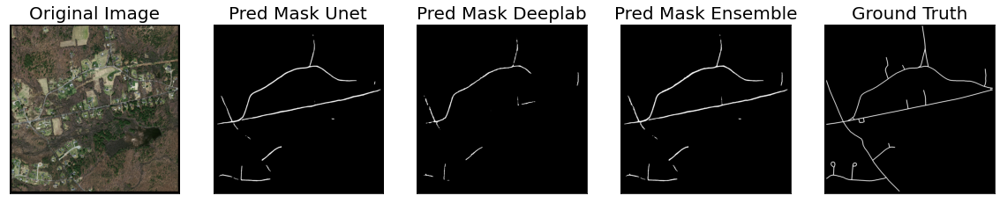

Ensemble IoU:  tensor(0.5810)
Ensemble Dice Loss:  tensor(0.2650)
UNet IoU:  tensor(0.5887)
UNet Dice Loss:  tensor(0.2589)
DeepLab IoU:  tensor(0.5496)
DeepLab Dice Loss:  tensor(0.2907)


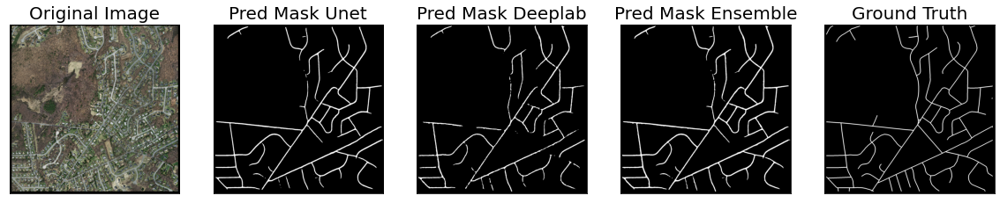

Ensemble IoU:  tensor(0.4053)
Ensemble Dice Loss:  tensor(0.4232)
UNet IoU:  tensor(0.3968)
UNet Dice Loss:  tensor(0.4318)
DeepLab IoU:  tensor(0.3966)
DeepLab Dice Loss:  tensor(0.4320)


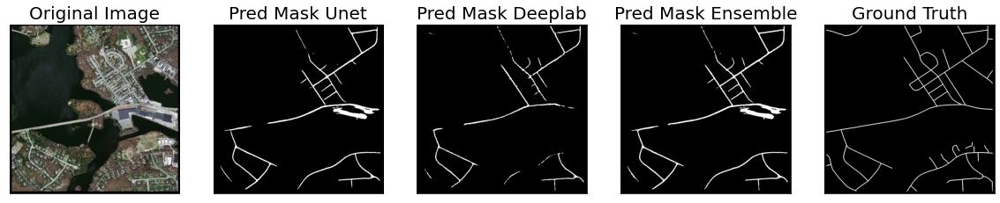

Ensemble IoU:  tensor(0.3258)
Ensemble Dice Loss:  tensor(0.5085)
UNet IoU:  tensor(0.2882)
UNet Dice Loss:  tensor(0.5525)
DeepLab IoU:  tensor(0.2535)
DeepLab Dice Loss:  tensor(0.5955)


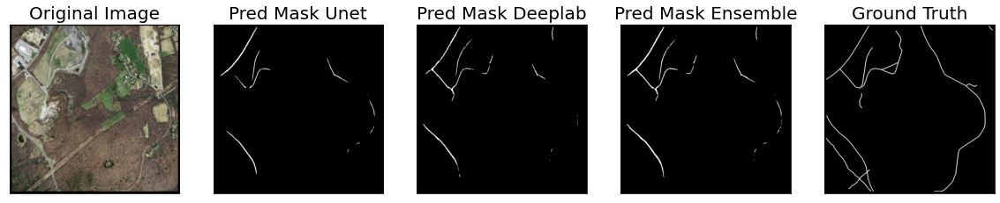

Ensemble IoU:  tensor(0.5514)
Ensemble Dice Loss:  tensor(0.2892)
UNet IoU:  tensor(0.5616)
UNet Dice Loss:  tensor(0.2807)
DeepLab IoU:  tensor(0.5258)
DeepLab Dice Loss:  tensor(0.3108)


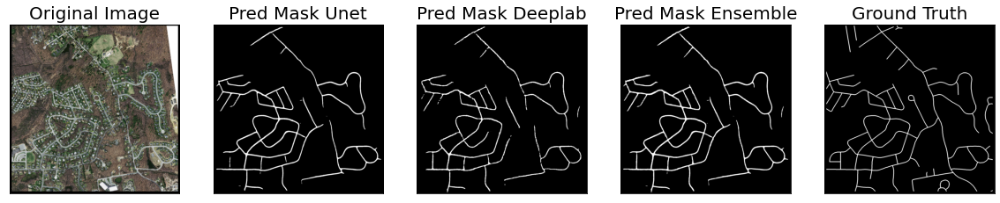

Ensemble IoU:  tensor(0.3097)
Ensemble Dice Loss:  tensor(0.5271)
UNet IoU:  tensor(0.2881)
UNet Dice Loss:  tensor(0.5527)
DeepLab IoU:  tensor(0.2339)
DeepLab Dice Loss:  tensor(0.6209)


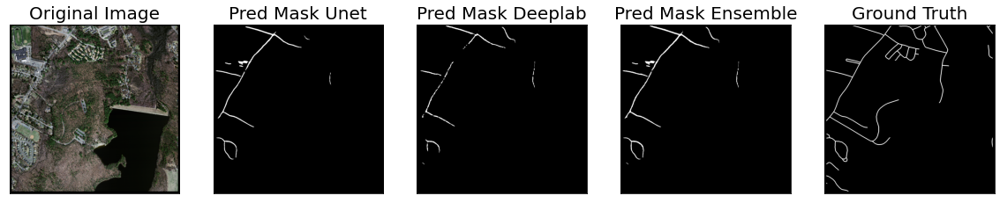

Ensemble IoU:  tensor(0.4963)
Ensemble Dice Loss:  tensor(0.3366)
UNet IoU:  tensor(0.5268)
UNet Dice Loss:  tensor(0.3099)
DeepLab IoU:  tensor(0.4737)
DeepLab Dice Loss:  tensor(0.3571)


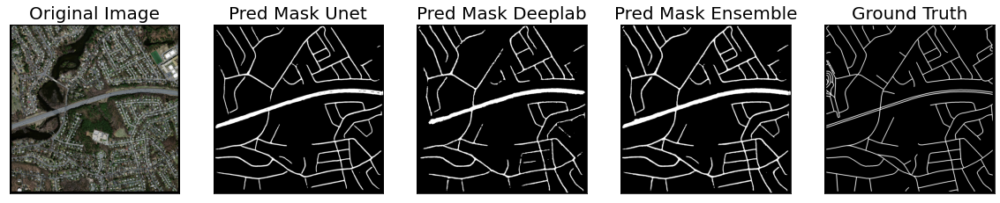

Ensemble IoU:  tensor(0.5060)
Ensemble Dice Loss:  tensor(0.3280)
UNet IoU:  tensor(0.5216)
UNet Dice Loss:  tensor(0.3144)
DeepLab IoU:  tensor(0.4760)
DeepLab Dice Loss:  tensor(0.3550)


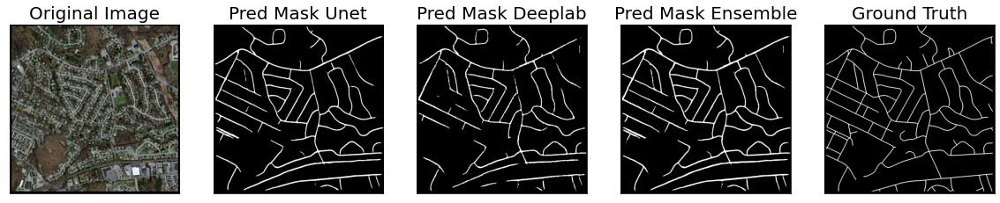

Ensemble IoU:  tensor(0.0267)
Ensemble Dice Loss:  tensor(0.9480)
UNet IoU:  tensor(0.0026)
UNet Dice Loss:  tensor(0.9948)
DeepLab IoU:  tensor(0.0267)
DeepLab Dice Loss:  tensor(0.9480)


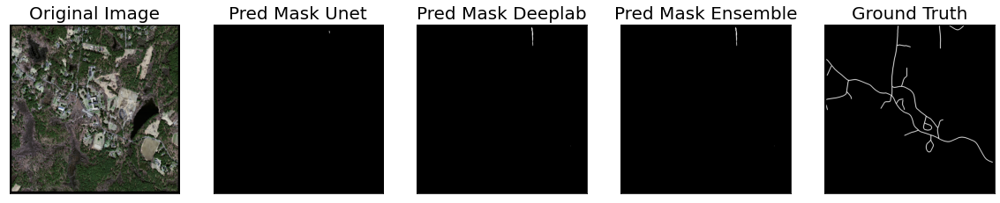

Ensemble IoU:  tensor(0.0203)
Ensemble Dice Loss:  tensor(0.9602)
UNet IoU:  tensor(0.0105)
UNet Dice Loss:  tensor(0.9792)
DeepLab IoU:  tensor(0.0125)
DeepLab Dice Loss:  tensor(0.9754)


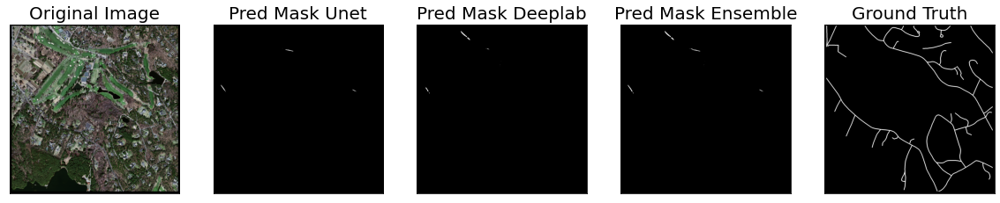

Ensemble IoU:  tensor(0.4226)
Ensemble Dice Loss:  tensor(0.4059)
UNet IoU:  tensor(0.4344)
UNet Dice Loss:  tensor(0.3943)
DeepLab IoU:  tensor(0.3189)
DeepLab Dice Loss:  tensor(0.5164)


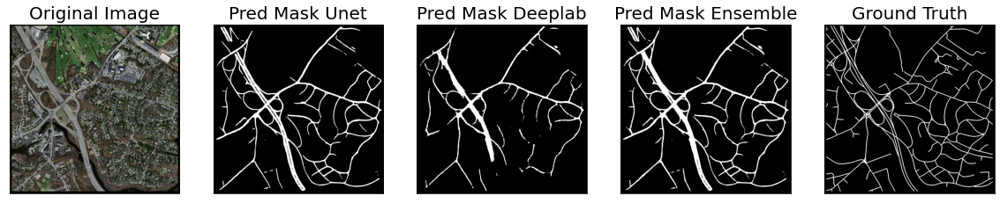

Ensemble IoU:  tensor(0.2972)
Ensemble Dice Loss:  tensor(0.5417)
UNet IoU:  tensor(0.2866)
UNet Dice Loss:  tensor(0.5545)
DeepLab IoU:  tensor(0.1753)
DeepLab Dice Loss:  tensor(0.7017)


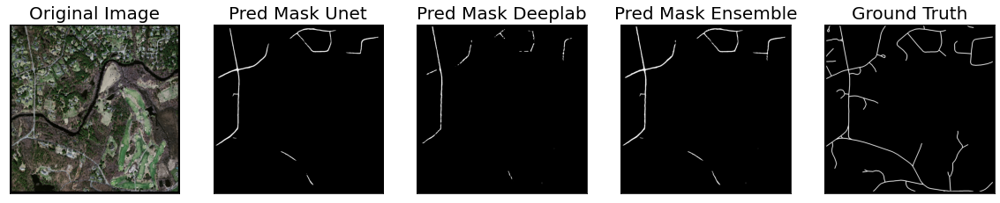

Ensemble IoU:  tensor(0.3989)
Ensemble Dice Loss:  tensor(0.4297)
UNet IoU:  tensor(0.3990)
UNet Dice Loss:  tensor(0.4296)
DeepLab IoU:  tensor(0.3675)
DeepLab Dice Loss:  tensor(0.4626)


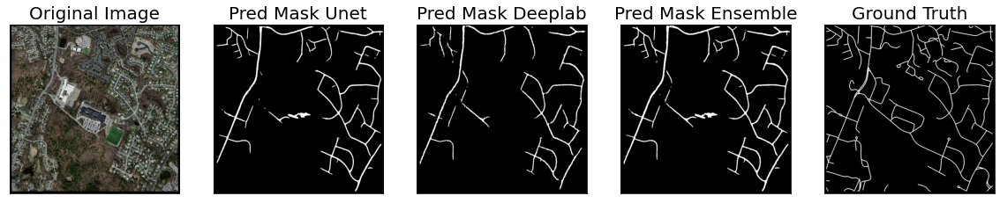

Ensemble IoU:  tensor(0.2952)
Ensemble Dice Loss:  tensor(0.5441)
UNet IoU:  tensor(0.2994)
UNet Dice Loss:  tensor(0.5392)
DeepLab IoU:  tensor(0.1782)
DeepLab Dice Loss:  tensor(0.6975)


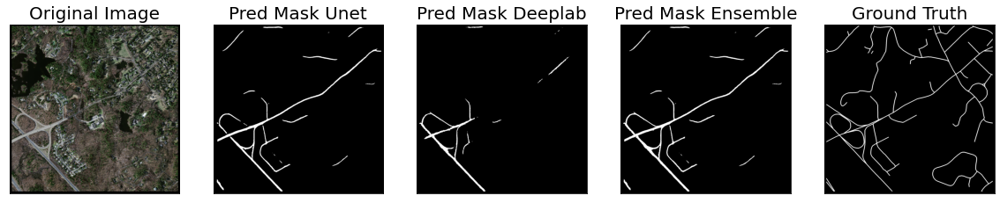

Ensemble IoU:  tensor(0.3437)
Ensemble Dice Loss:  tensor(0.4884)
UNet IoU:  tensor(0.3527)
UNet Dice Loss:  tensor(0.4785)
DeepLab IoU:  tensor(0.2430)
DeepLab Dice Loss:  tensor(0.6090)


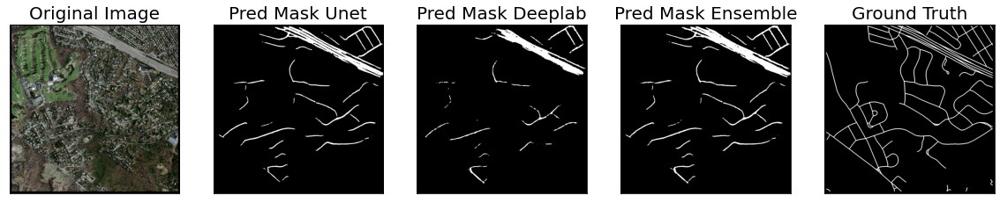

Ensemble IoU:  tensor(0.3944)
Ensemble Dice Loss:  tensor(0.4344)
UNet IoU:  tensor(0.4057)
UNet Dice Loss:  tensor(0.4228)
DeepLab IoU:  tensor(0.3500)
DeepLab Dice Loss:  tensor(0.4815)


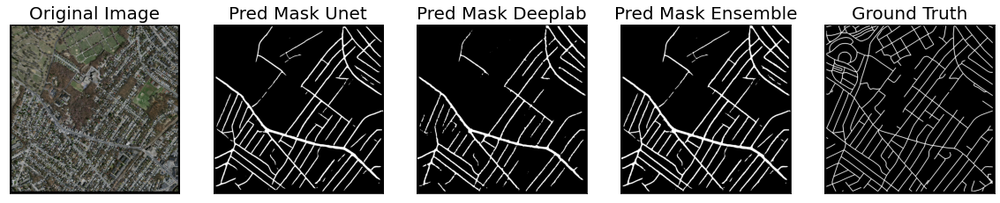

Ensemble IoU:  tensor(0.2815)
Ensemble Dice Loss:  tensor(0.5606)
UNet IoU:  tensor(0.2740)
UNet Dice Loss:  tensor(0.5699)
DeepLab IoU:  tensor(0.1897)
DeepLab Dice Loss:  tensor(0.6811)


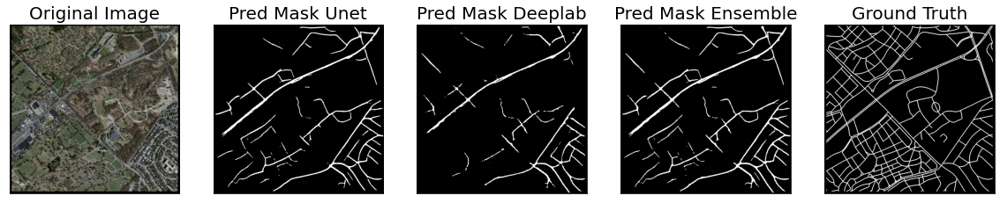

Ensemble IoU:  tensor(0.3903)
Ensemble Dice Loss:  tensor(0.4385)
UNet IoU:  tensor(0.3813)
UNet Dice Loss:  tensor(0.4479)
DeepLab IoU:  tensor(0.3383)
DeepLab Dice Loss:  tensor(0.4944)


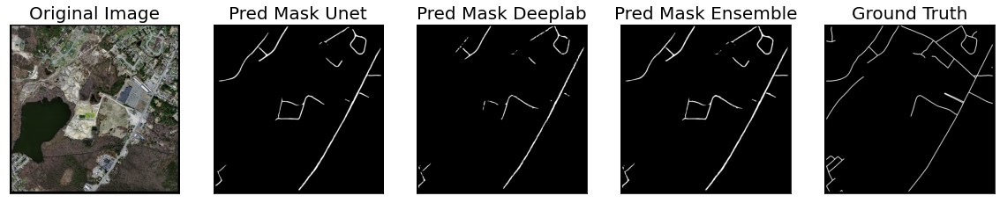

Ensemble IoU:  tensor(0.3283)
Ensemble Dice Loss:  tensor(0.5056)
UNet IoU:  tensor(0.3129)
UNet Dice Loss:  tensor(0.5233)
DeepLab IoU:  tensor(0.2870)
DeepLab Dice Loss:  tensor(0.5540)


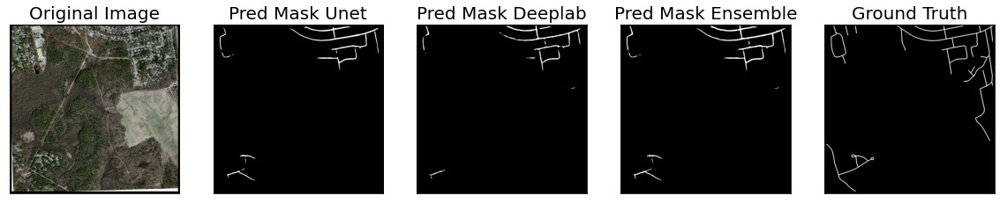

Ensemble IoU:  tensor(0.4756)
Ensemble Dice Loss:  tensor(0.3553)
UNet IoU:  tensor(0.4949)
UNet Dice Loss:  tensor(0.3379)
DeepLab IoU:  tensor(0.4419)
DeepLab Dice Loss:  tensor(0.3870)


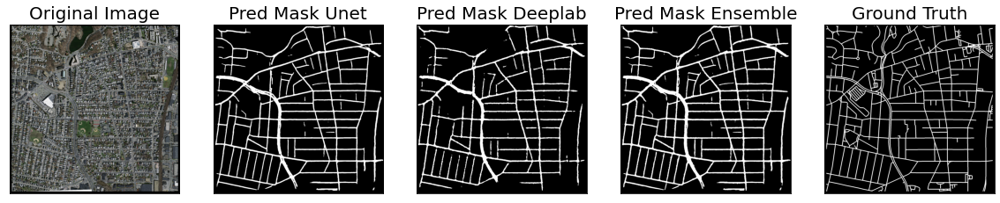

Ensemble IoU:  tensor(0.2168)
Ensemble Dice Loss:  tensor(0.6436)
UNet IoU:  tensor(0.2167)
UNet Dice Loss:  tensor(0.6438)
DeepLab IoU:  tensor(0.1102)
DeepLab Dice Loss:  tensor(0.8014)


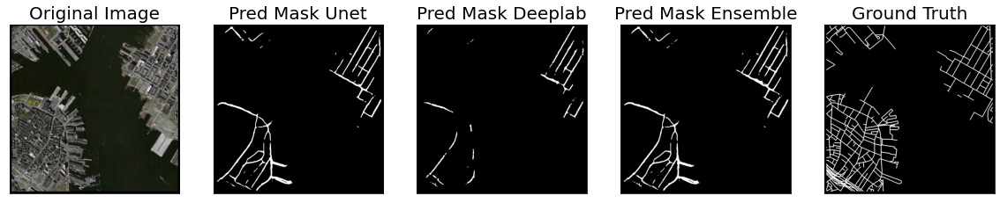

Ensemble IoU:  tensor(0.4265)
Ensemble Dice Loss:  tensor(0.4020)
UNet IoU:  tensor(0.4123)
UNet Dice Loss:  tensor(0.4161)
DeepLab IoU:  tensor(0.3512)
DeepLab Dice Loss:  tensor(0.4802)


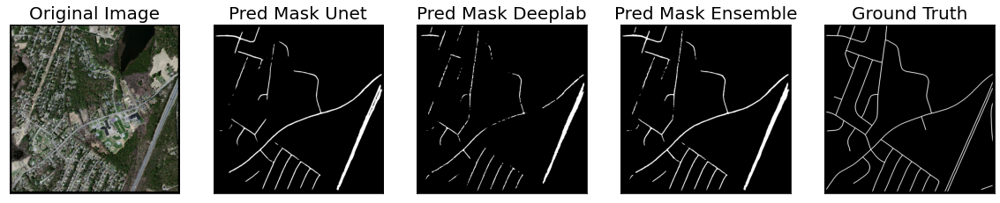

Ensemble IoU:  tensor(0.2819)
Ensemble Dice Loss:  tensor(0.5602)
UNet IoU:  tensor(0.2941)
UNet Dice Loss:  tensor(0.5454)
DeepLab IoU:  tensor(0.3539)
DeepLab Dice Loss:  tensor(0.4773)


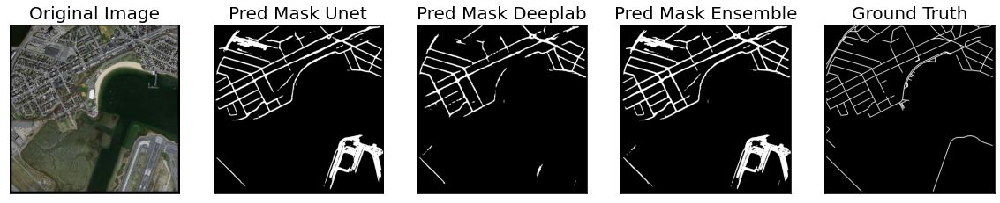

Ensemble IoU:  tensor(0.4634)
Ensemble Dice Loss:  tensor(0.3667)
UNet IoU:  tensor(0.4722)
UNet Dice Loss:  tensor(0.3585)
DeepLab IoU:  tensor(0.4244)
DeepLab Dice Loss:  tensor(0.4041)


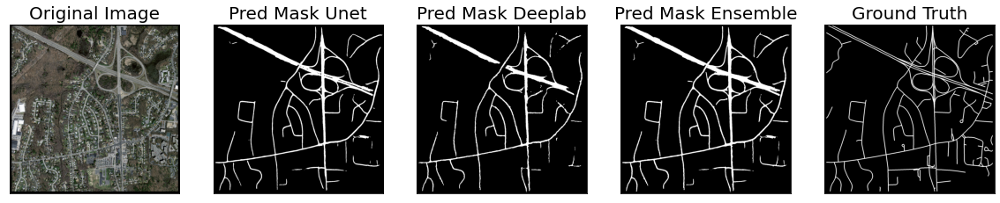

Ensemble IoU:  tensor(0.4704)
Ensemble Dice Loss:  tensor(0.3601)
UNet IoU:  tensor(0.4755)
UNet Dice Loss:  tensor(0.3555)
DeepLab IoU:  tensor(0.4089)
DeepLab Dice Loss:  tensor(0.4196)


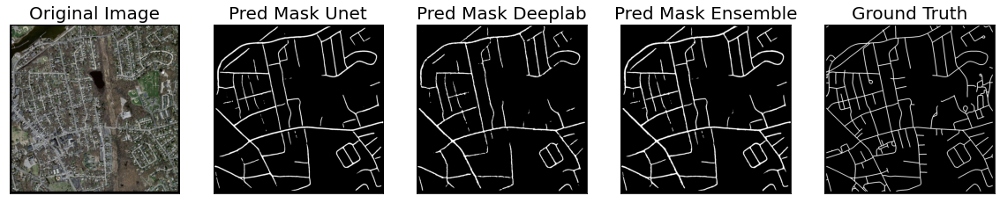

Ensemble IoU:  tensor(0.4737)
Ensemble Dice Loss:  tensor(0.3571)
UNet IoU:  tensor(0.4936)
UNet Dice Loss:  tensor(0.3390)
DeepLab IoU:  tensor(0.4174)
DeepLab Dice Loss:  tensor(0.4111)


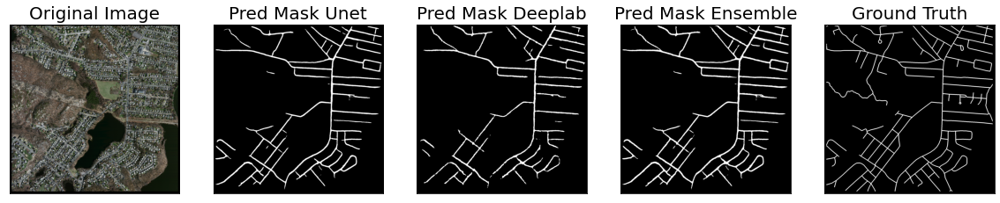

Ensemble IoU:  tensor(0.4334)
Ensemble Dice Loss:  tensor(0.3953)
UNet IoU:  tensor(0.4337)
UNet Dice Loss:  tensor(0.3950)
DeepLab IoU:  tensor(0.3930)
DeepLab Dice Loss:  tensor(0.4357)


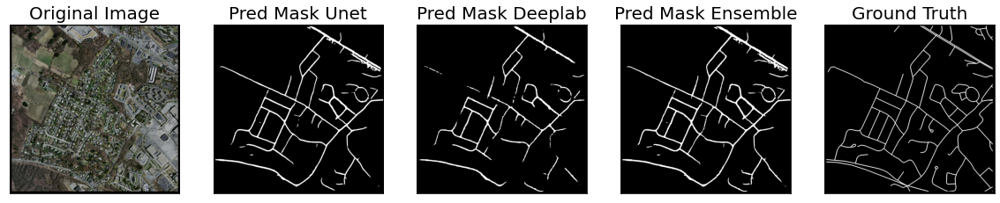

Ensemble IoU:  tensor(0.4149)
Ensemble Dice Loss:  tensor(0.4135)
UNet IoU:  tensor(0.4128)
UNet Dice Loss:  tensor(0.4156)
DeepLab IoU:  tensor(0.3721)
DeepLab Dice Loss:  tensor(0.4576)


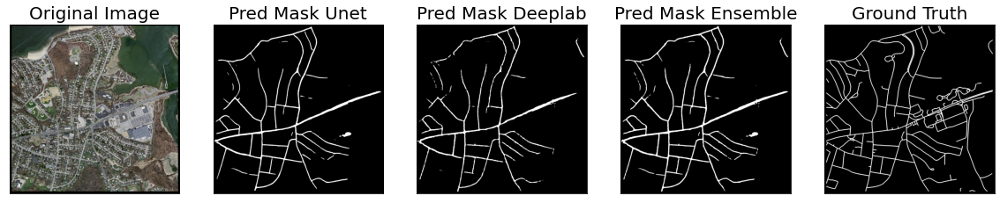

Ensemble IoU:  tensor(0.4064)
Ensemble Dice Loss:  tensor(0.4220)
UNet IoU:  tensor(0.4223)
UNet Dice Loss:  tensor(0.4062)
DeepLab IoU:  tensor(0.3556)
DeepLab Dice Loss:  tensor(0.4753)


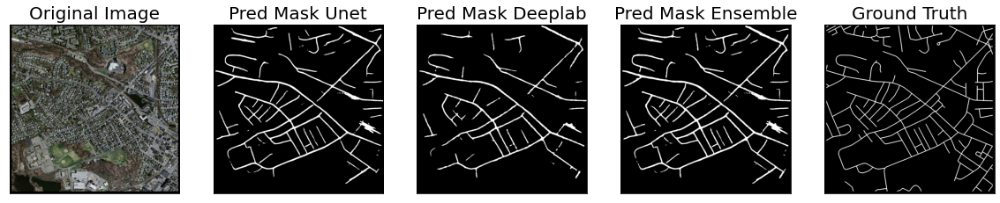

Ensemble IoU:  tensor(0.1754)
Ensemble Dice Loss:  tensor(0.7016)
UNet IoU:  tensor(0.1643)
UNet Dice Loss:  tensor(0.7178)
DeepLab IoU:  tensor(0.0805)
DeepLab Dice Loss:  tensor(0.8509)


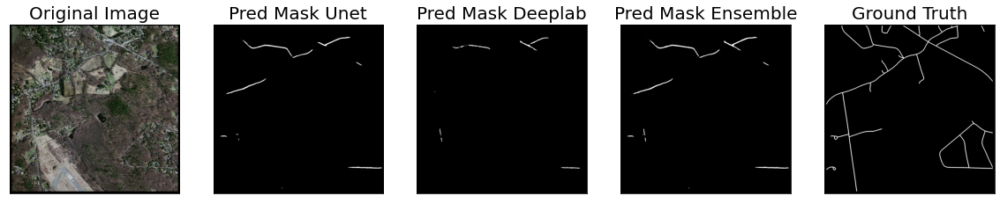

Ensemble IoU:  tensor(0.3191)
Ensemble Dice Loss:  tensor(0.5161)
UNet IoU:  tensor(0.3214)
UNet Dice Loss:  tensor(0.5135)
DeepLab IoU:  tensor(0.2288)
DeepLab Dice Loss:  tensor(0.6276)


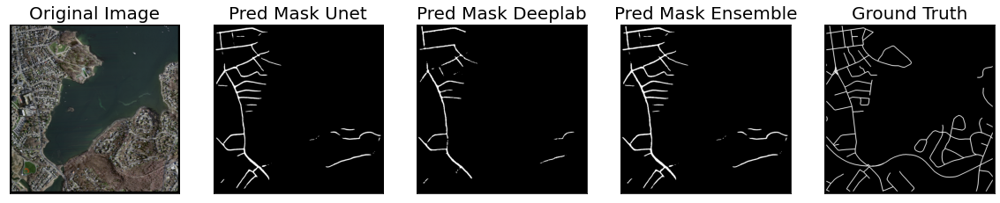

Ensemble IoU:  tensor(0.3395)
Ensemble Dice Loss:  tensor(0.4931)
UNet IoU:  tensor(0.3305)
UNet Dice Loss:  tensor(0.5032)
DeepLab IoU:  tensor(0.3347)
DeepLab Dice Loss:  tensor(0.4984)


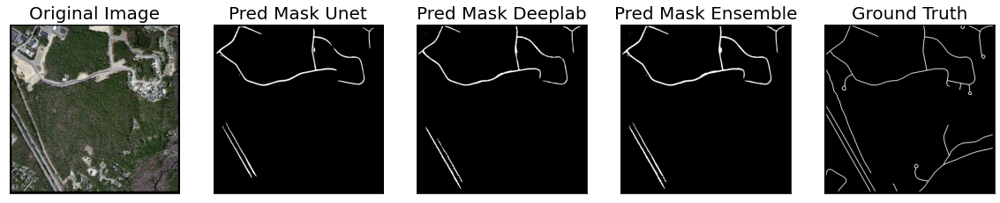

Ensemble IoU:  tensor(0.3217)
Ensemble Dice Loss:  tensor(0.5132)
UNet IoU:  tensor(0.3234)
UNet Dice Loss:  tensor(0.5112)
DeepLab IoU:  tensor(0.2304)
DeepLab Dice Loss:  tensor(0.6254)


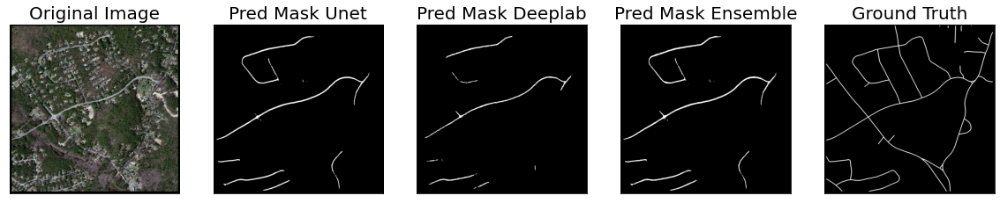

Ensemble IoU:  tensor(0.2775)
Ensemble Dice Loss:  tensor(0.5656)
UNet IoU:  tensor(0.2648)
UNet Dice Loss:  tensor(0.5813)
DeepLab IoU:  tensor(0.1815)
DeepLab Dice Loss:  tensor(0.6927)


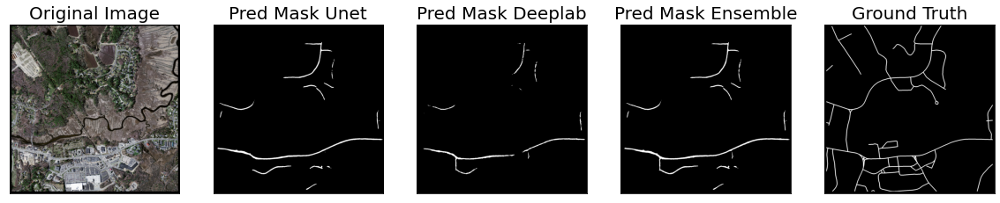

Ensemble IoU:  tensor(0.2861)
Ensemble Dice Loss:  tensor(0.5551)
UNet IoU:  tensor(0.2751)
UNet Dice Loss:  tensor(0.5685)
DeepLab IoU:  tensor(0.2246)
DeepLab Dice Loss:  tensor(0.6331)


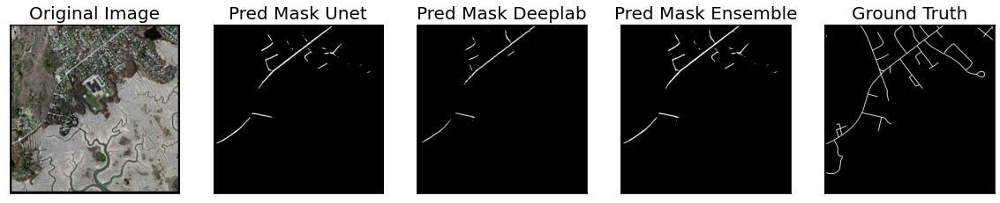

Ensemble IoU Score: 0.3467138111591339
Ensemble Dice Loss: 0.49970030784606934
UNet IoU Score: 0.3433602750301361
UNet Dice Loss: 0.5051444172859192
DeepLab IoU Score: 0.2913133203983307
DeepLab Dice Loss: 0.5653687119483948


In [ ]:
import pickle

iou_score = 0
dice_loss = 0

u_iou_score = 0
u_dice_loss = 0

d_iou_score = 0
d_dice_loss = 0


for idx in range(len(test_dataset)):
    
    image, gt_mask = test_dataset[idx]
    image = preprocess_resize_image(image)

    image_vis, gt_mask_vis = test_dataset_vis[idx]
    image_vis = cv2.resize(image_vis.astype('uint8'), (1500, 1500), interpolation = cv2.INTER_AREA)
    gt_mask_vis = cv2.resize(colour_code_segmentation(reverse_one_hot(gt_mask_vis), select_class_rgb_values).astype('uint8'), (1536, 1536), interpolation = cv2.INTER_AREA)

    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)

    pred_mask_unet = best_model_unet(x_tensor)
    pred_mask_deepLab = best_model_deepLab(x_tensor)

    pred_mask_unet = pred_mask_unet.detach().squeeze().cpu().numpy()
    pred_mask_deepLab = pred_mask_deepLab.detach().squeeze().cpu().numpy()

    pred_mask_unet = np.transpose(pred_mask_unet,(1,2,0))
    pred_mask_deepLab = np.transpose(pred_mask_deepLab,(1,2,0))
    pred_mask_ensemble = get_ensemble_maxpool_prediction(pred_mask_unet, pred_mask_deepLab)

    # with open(os.path.join(sample_preds_folder, prediction_matrix, f"sample_pred_{idx}.pkl"), 'wb') as f:
    #     pickle.dump(pred_mask_ensemble, f)

    pred_mask_unet = colour_code_segmentation(reverse_one_hot(pred_mask_unet), select_class_rgb_values)
    pred_mask_deepLab = colour_code_segmentation(reverse_one_hot(pred_mask_deepLab), select_class_rgb_values)
    pred_mask_ensemble = colour_code_segmentation(reverse_one_hot(pred_mask_ensemble), select_class_rgb_values)

    im_gray = cv2.cvtColor(gt_mask_vis.astype('uint8'), cv2.COLOR_BGR2GRAY)
    pm_gray = cv2.cvtColor(pred_mask_ensemble.astype('uint8'), cv2.COLOR_BGR2GRAY)
    u_pm_gray = cv2.cvtColor(pred_mask_unet.astype('uint8'), cv2.COLOR_BGR2GRAY)
    d_pm_gray = cv2.cvtColor(pred_mask_deepLab.astype('uint8'), cv2.COLOR_BGR2GRAY)

    pm_gray = pm_gray == 255
    im_gray = im_gray == 255
    u_pm_gray = u_pm_gray == 255
    d_pm_gray = d_pm_gray == 255

    temp_iou = get_iou_score(torch.tensor(pm_gray), torch.tensor(im_gray))
    temp_dice = get_dice_loss(torch.tensor(pm_gray), torch.tensor(im_gray))

    iou_score += temp_iou
    dice_loss += temp_dice

    print("Ensemble IoU: ", temp_iou)
    print("Ensemble Dice Loss: ", temp_dice)

    temp_iou = get_iou_score(torch.tensor(u_pm_gray), torch.tensor(im_gray))
    temp_dice = get_dice_loss(torch.tensor(u_pm_gray), torch.tensor(im_gray))

    u_iou_score += temp_iou
    u_dice_loss += temp_dice

    print("UNet IoU: ", temp_iou)
    print("UNet Dice Loss: ", temp_dice)

    temp_iou = get_iou_score(torch.tensor(d_pm_gray), torch.tensor(im_gray))
    temp_dice = get_dice_loss(torch.tensor(d_pm_gray), torch.tensor(im_gray))

    d_iou_score += temp_iou
    d_dice_loss += temp_dice

    print("DeepLab IoU: ", temp_iou)
    print("DeepLab Dice Loss: ", temp_dice)

    # Get prediction channel corresponding to road
    # pred_road_heatmap = pred_mask_ensemble[:,:,select_classes.index('road')]
    # pred_road_heatmap = cv2.cvtColor(pred_road_heatmap, cv2.COLOR_BGR2RGB)

    # cv2.imwrite(os.path.join(sample_preds_folder, original_image_folder, f"sample_pred_{idx}.png"), cv2.cvtColor(image_vis, cv2.COLOR_RGB2BGR))
    # cv2.imwrite(os.path.join(sample_preds_folder, predictions_folder, f"sample_pred_{idx}.png"), pred_mask_ensemble)
    # cv2.imwrite(os.path.join(sample_preds_folder, ground_truth_folder, f"sample_pred_{idx}.png"), gt_mask_vis)

    visualize(
        original_image = image_vis,
        pred_mask_unet = pred_mask_unet,
        pred_mask_deepLab = pred_mask_deepLab,
        pred_mask_ensemble = pred_mask_ensemble,
        ground_truth = gt_mask_vis
    )

print(f"Ensemble IoU Score: {iou_score/len(test_dataset)}")
print(f"Ensemble Dice Loss: {dice_loss/len(test_dataset)}")

print(f"UNet IoU Score: {u_iou_score/len(test_dataset)}")
print(f"UNet Dice Loss: {u_dice_loss/len(test_dataset)}")

print(f"DeepLab IoU Score: {d_iou_score/len(test_dataset)}")
print(f"DeepLab Dice Loss: {d_dice_loss/len(test_dataset)}")

In [ ]:
# define loss function
loss = smp.utils.losses.DiceLoss()

# define metrics
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

In [ ]:
test_epoch = smp.utils.train.ValidEpoch(
    best_model_unet,
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

valid_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {valid_logs['iou_score']:.4f}")
print(f"Mean Dice Loss: {valid_logs['dice_loss']:.4f}")

valid: 100%|██████████| 49/49 [03:12<00:00,  3.94s/it, dice_loss - 0.06365, iou_score - 0.8817]
Evaluation on Test Data: 
Mean IoU Score: 0.8817
Mean Dice Loss: 0.0637


In [ ]:
test_epoch = smp.utils.train.ValidEpoch(
    best_model_deepLab,
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

valid_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {valid_logs['iou_score']:.4f}")
print(f"Mean Dice Loss: {valid_logs['dice_loss']:.4f}")

valid: 100%|██████████| 49/49 [00:24<00:00,  1.96it/s, dice_loss - 0.06368, iou_score - 0.8823]
Evaluation on Test Data: 
Mean IoU Score: 0.8823
Mean Dice Loss: 0.0637
